# HORUS - Crowd Analyzer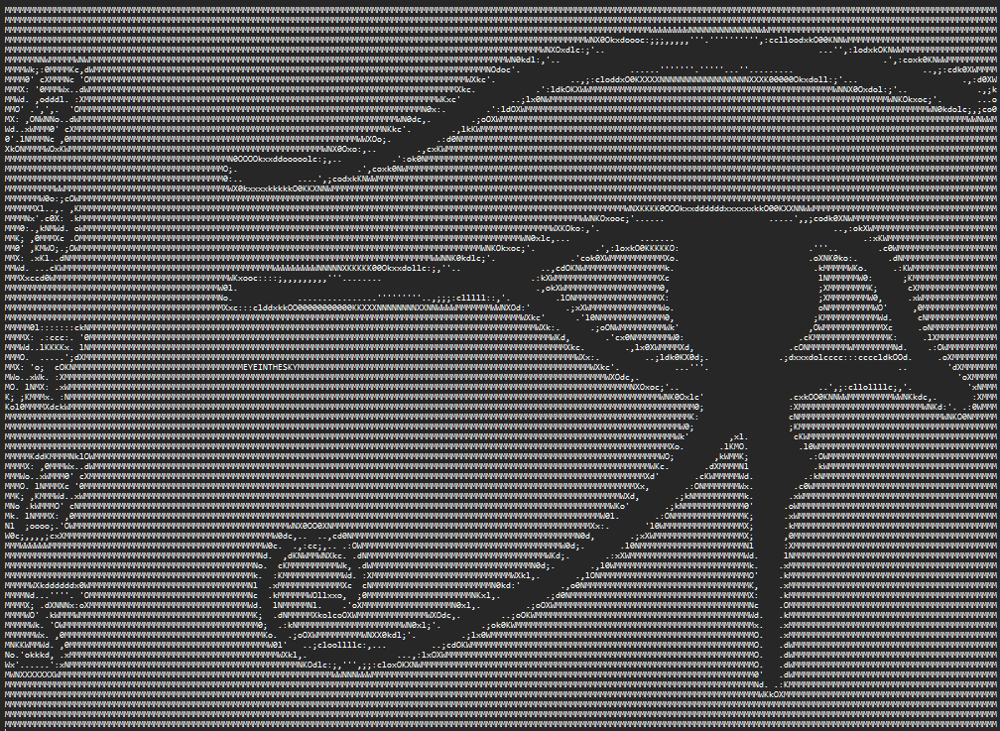

## Labraries Install and Import



**[InsightFace](https://github.com/deepinsight/insightface)** efficiently implements a rich variety of state of the art algorithms of face recognition, face detection and face alignment, which optimized for both training and deployment.

In [ ]:
#https://github.com/deepinsight/insightface
!pip install insightface
!pip install onnxruntime

**[GFPGAN](https://github.com/TencentARC/GFPGAN.git)** aims at developing a Practical Algorithm for Real-world Face Restoration.
It leverages rich and diverse priors encapsulated in a pretrained face GAN (e.g., StyleGAN2) for blind face restoration.

In [ ]:
# Clone GFPGAN and enter the GFPGAN folder
%cd /content
!rm -rf GFPGAN
!git clone https://github.com/TencentARC/GFPGAN.git
%cd GFPGAN

# Set up the environment
# Install basicsr - https://github.com/xinntao/BasicSR
# Set BASICSR_EXT=True to compile the cuda extensions in the BasicSR - It may take several minutes to compile, please be patient.
!BASICSR_EXT=True pip install basicsr
# Install facexlib - https://github.com/xinntao/facexlib
# We use face detection and face restoration helper in the facexlib package
!pip install facexlib
# Install other depencencies
!pip install -r requirements.txt
!python setup.py develop
!pip install realesrgan  # used for enhancing the background (non-face) regions
# Download the pre-trained model
!wget https://github.com/TencentARC/GFPGAN/releases/download/v0.1.0/GFPGANv1.pth -P experiments/pretrained_models
# uninstall latest torchvision to avoid version problem in basicsr
!pip uninstall torchvision
#installing latest compatible torchvision version
!pip install torchvision==0.16.2

In [ ]:
import numpy as np
import os
import glob
import cv2
import matplotlib.pyplot as plt
import insightface
from insightface.app import FaceAnalysis
from sklearn.metrics.pairwise import cosine_similarity
from google.colab import files
import shutil
import math
import pandas as pd
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Image Upload

Here, you can upload an image of a group of people.

In [ ]:
def createDir(path):
  if os.path.exists(path):
    shutil.rmtree(path)
    os.makedirs(path)
  else:
    os.makedirs(path)

In [ ]:
#creating folders
upload_folder = '/content/upload/'
processed_folder = '/content/processed/'

createDir(upload_folder)
createDir(processed_folder)

In [ ]:
# uploading image
uploaded = files.upload()
for filename in uploaded.keys():
  dst_path = os.path.join(upload_folder, filename)
  print(f'move {filename} to {dst_path}')
  shutil.move(filename, dst_path)

Saving input_image.jpg to input_image.jpg
move input_image.jpg to /content/upload/input_image.jpg


Uploaded Image


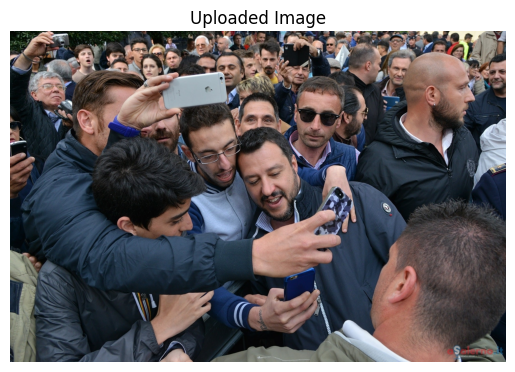

In [ ]:
#visualisation of the uploaded image
raw_img = cv2.imread(os.path.join(upload_folder, list(uploaded.keys())[0]))
print("Uploaded Image")
plt.axis('off')
plt.imshow(raw_img[:,:,::-1])
plt.title("Uploaded Image")
plt.rcParams["figure.figsize"] = (50,100)
plt.show()

## Face Restoration

Now, you can apply the GFPGAN model to enhance the quality of the faces in the uploaded image.

It is very useful when the quality of the input image is low.

In [ ]:
# Now we use the GFPGAN to restore the above low-quality images
# We use [Real-ESRGAN](https://github.com/xinntao/Real-ESRGAN) for enhancing the background (non-face) regions
# You can find the different models in https://github.com/TencentARC/GFPGAN#european_castle-model-zoo
!python inference_gfpgan.py -i $upload_folder -o $processed_folder -v 1.4 -s 2 --bg_upsampler realesrgan --bg_tile 800
# Usage: python inference_gfpgan.py -i inputs/whole_imgs -o results -v 1.3 -s 2 [options]...
#
#  -h                   show this help
#  -i input             Input image or folder. Default: inputs/whole_imgs
#  -o output            Output folder. Default: results
#  -v version           GFPGAN model version. Option: 1 | 1.2 | 1.3. Default: 1.3
#  -s upscale           The final upsampling scale of the image. Default: 2
#  -bg_upsampler        background upsampler. Default: realesrgan
#  -bg_tile             Tile size for background sampler, 0 for no tile during testing. Default: 400
#  -suffix              Suffix of the restored faces
#  -only_center_face    Only restore the center face
#  -aligned             Input are aligned faces
#  -ext                 Image extension. Options: auto | jpg | png, auto means using the same extension as inputs. Default: auto

Restored Image


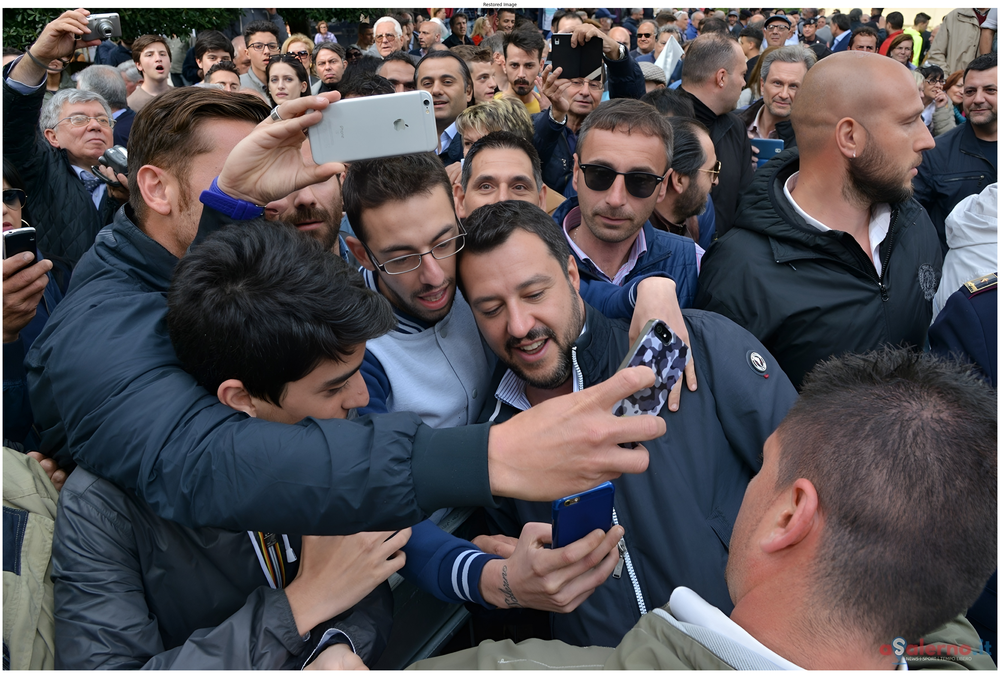

In [ ]:
#visualisation of the restored image
restored_img = cv2.imread(os.path.join(processed_folder,"restored_imgs",list(uploaded.keys())[0]))
print("Restored Image")
plt.axis('off')
plt.imshow(restored_img[:,:,::-1])
plt.title("Restored Image")
plt.rcParams["figure.figsize"] = (50,100)
plt.show()

## Face Detection

You are ready to apply the AI model to detect all the faces in the uploaded image.

In [ ]:
#initializing the class for face analysis and detection
app = FaceAnalysis(name='buffalo_l')
app.prepare(ctx_id=0, det_size=(640,640))

download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:05<00:00, 55342.44KB/s]


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


In [ ]:
faces = app.get(restored_img)

In [ ]:
print("Detected {} faces".format(len(faces)))

Detected 37 faces


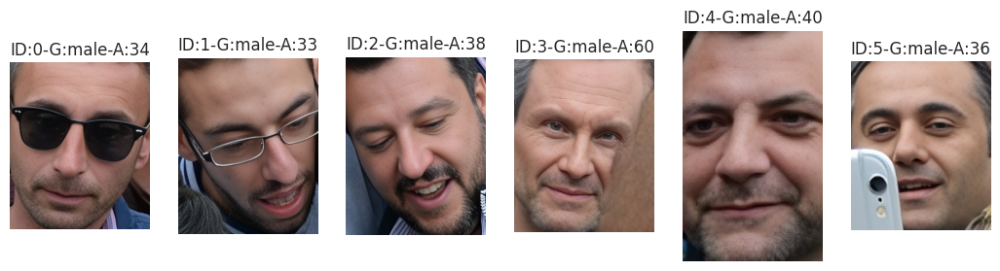

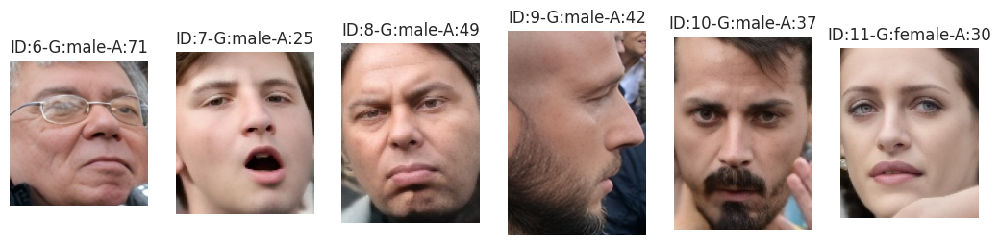

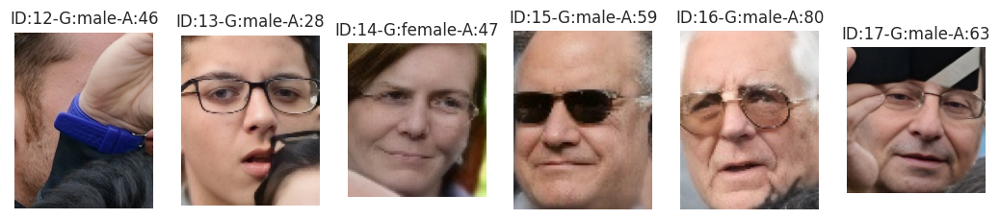

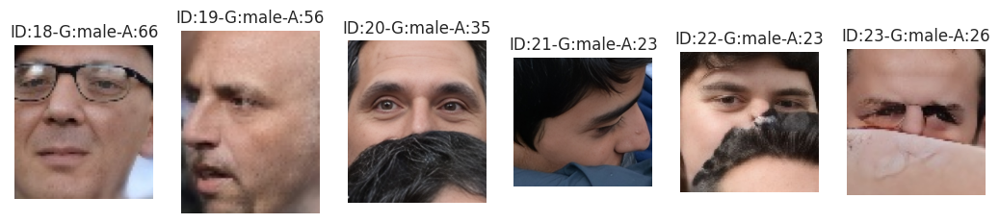

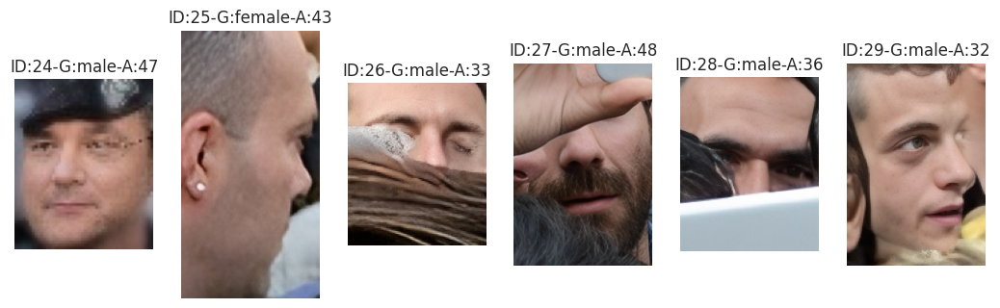

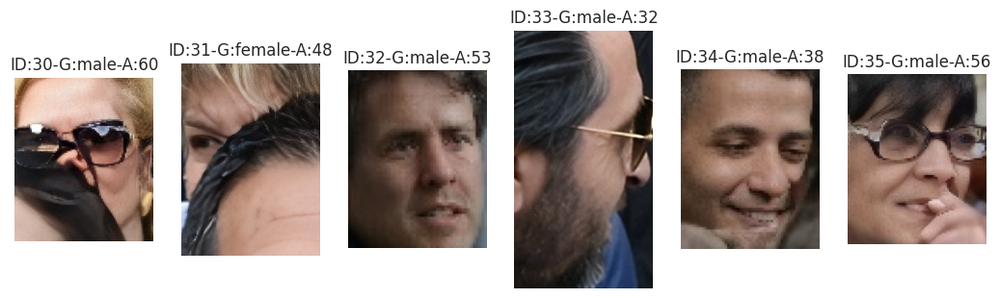

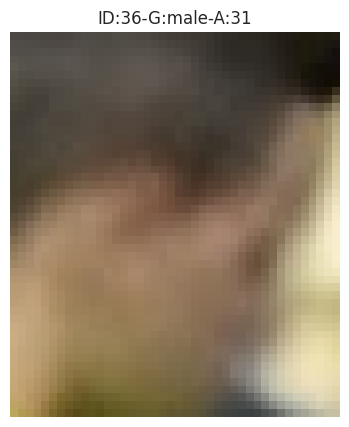

In [ ]:
#visualisation of the results of the face analysis. Every image has: ID, Gender and Age infered by the model

def decodeGender(input):
  if input == 1:
    return "male"
  elif input == 0:
    return "female"
  else:
    return "unknown"


df_dectected_faces = pd.DataFrame({'ID': [], 'GENDER': [], 'AGE': [], 'BBOX': [], 'EMBEDDING': []})

for idx in range(0,int(math.ceil(len(faces)/6))):
  start = 6*idx

  if idx!=int(math.ceil(len(faces)/6))-1:
    fig, axs = plt.subplots(1,6, figsize=(13,5))
    stop = 6*(idx+1)
  else:
    stop = start+len(faces)%6
    fig, axs = plt.subplots(1,len(faces[start:stop]), figsize=(12,5))

  for i,face in enumerate(faces[start:stop]):
    try:
      bbox = face['bbox']
      bbox = [int(b) for b in bbox]
      if len(faces[start:stop])!=1:
        axs[i].set_title("ID:{}-G:{}-A:{}".format(start+i,decodeGender(face['gender']),face['age']))
        axs[i].imshow(restored_img[bbox[1]:bbox[3],bbox[0]:bbox[2], ::-1])
        axs[i].axis('off')
        df_dectected_faces = pd.concat([df_dectected_faces, pd.DataFrame({'ID': [int(start+i)], 'GENDER': [decodeGender(face['gender'])], 'AGE': [face['age']], 'BBOX': [bbox], 'EMBEDDING': [face['embedding']]})])
      else:
        axs.set_title("ID:{}-G:{}-A:{}".format(start+i,decodeGender(face['gender']),face['age']))
        axs.imshow(restored_img[bbox[1]:bbox[3],bbox[0]:bbox[2], ::-1])
        axs.axis('off')
        df_dectected_faces = pd.concat([df_dectected_faces, pd.DataFrame({'ID': [int(start+i)], 'GENDER': [decodeGender(face['gender'])], 'AGE': [face['age']], 'BBOX': [bbox], 'EMBEDDING': [face['embedding']]})])
    except:
      print("Detction failed for face with id {}".format(i))

df_dectected_faces.set_index('ID', inplace=True)

In [ ]:
# computation of the evaluation metrics
def precision(n_true_positive,n_false_positive):
    return  n_true_positive/(n_true_positive+n_false_positive)*100

def recall(n_true_positive,n_false_negative):
    return  n_true_positive/(n_true_positive+n_false_negative)*100

def accuracy(n_true_positive,n_total):
    return n_true_positive/n_total*100
def f1_score(precision,recall):
    return 2/((1/recall)+(1/precision))

print('The accuracy of the model is {}%'.format(round(accuracy(34,37),1)))
print('The precision of the model is {}%'.format((round((precision(3,1)+precision(31,2))/2,1))))
print('The recall of the model is {}%'.format((round((recall(31,1)+recall(3,2))/2,1))))
print('The f1-score of the model is {}%'.format((round((f1_score(precision(31,2),recall(31,1))+f1_score(precision(3,1),recall(3,2)))/2,1))))
print('\n')
print('The precision of the model for male faces is {}%'.format(round(precision(31,2),1)))
print('The recall of the model for male faces is {}%'.format(round(recall(31,1),1)))
print('The f1-score of the model for male faces is {}%'.format(round(f1_score(precision(31,2),recall(31,1)),1)))
print('\n')
print('The precision of the model for female faces is {}%'.format(round(precision(3,1),1)))
print('The recall of the model for female faces is {}%'.format(round(recall(3,2),1)))
print('The f1-score of the model for female faces is {}%'.format(round(f1_score(precision(3,1),recall(3,2)),1)))



The accuracy of the model is 91.9%
The precision of the model is 84.5%
The recall of the model is 78.4%
The f1-score of the model is 81.0%


The precision of the model for male faces is 93.9%
The recall of the model for male faces is 96.9%
The f1-score of the model for male faces is 95.4%


The precision of the model for female faces is 75.0%
The recall of the model for female faces is 60.0%
The f1-score of the model for female faces is 66.7%


These are all the faces detected and analyzed by the model.

For each detected face, you can get Predicted Gender (G) and Predicted Age (A).



### Crowd Analysis

At this point, you have all the information needed to analyze the crowd in the uploaded image.

For example, you can plot the Gender Distribution and Age Distribution as follows.

In [ ]:
df_dectected_faces

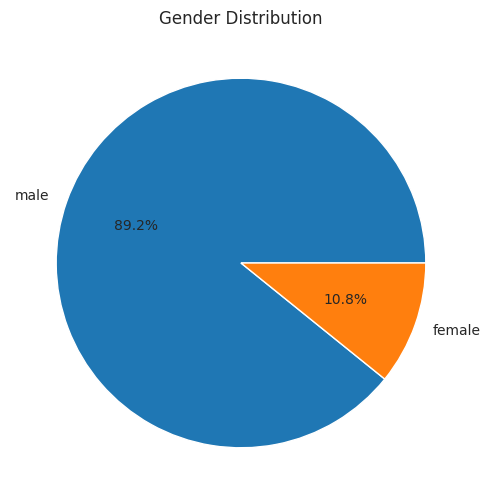

In [ ]:
df_pie = df_dectected_faces['GENDER'].value_counts().to_frame()

sns.set_style("whitegrid")
plt.figure(figsize=(6,6))
plt.pie(df_pie['count'], labels=df_pie.index, autopct='%1.1f%%')
plt.title('Gender Distribution')
plt.show()

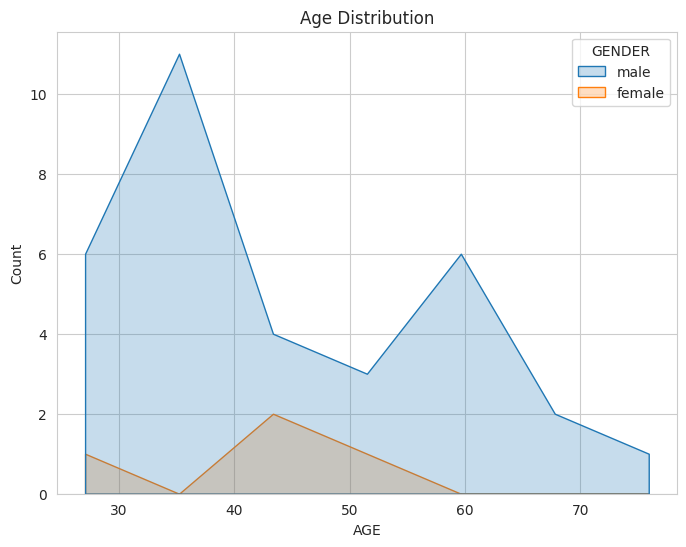

In [ ]:
plt.figure(figsize=(8, 6))
sns.histplot(data=df_dectected_faces, x="AGE", hue="GENDER", element="poly")
plt.title('Age Distribution')
plt.show()

### Face Finder

Check out this amazing feature!

You can import an image of a face and search for it within previously uploaded image.

Let's try it out!

In [ ]:
# creating folder
target_folder = '/content/target/'

createDir(target_folder)

# upload images
uploaded = files.upload()
for filename in uploaded.keys():
  dst_path = os.path.join(target_folder, filename)
  print(f'move {filename} to {dst_path}')
  shutil.move(filename, dst_path)

Saving old_salvini.jpg to old_salvini.jpg
move old_salvini.jpg to /content/target/old_salvini.jpg


In [ ]:
# doing the restoration, face analysis and detection for the image chosen before

!python inference_gfpgan.py -i $target_folder -o $processed_folder -v 1.4 -s 2 --bg_upsampler realesrgan --bg_tile 800
target_img = cv2.imread(os.path.join(processed_folder,"restored_imgs", list(uploaded.keys())[-1]))

#target_img = cv2.imread(os.path.join(target_folder, list(uploaded.keys())[0]))
target_face = app.get(target_img)[0]

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Processing old_salvini.jpg ...
	Tile 1/1
Results are in the [/content/processed/] folder.


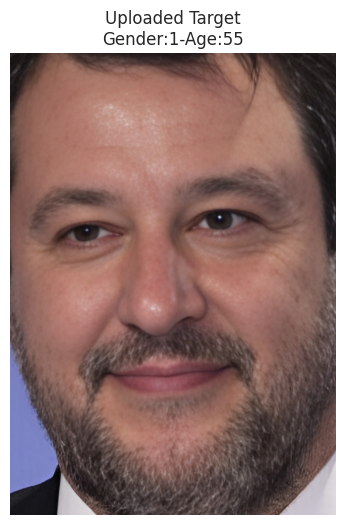

In [ ]:
# visualisation of the target image
bbox = target_face['bbox']
bbox = [int(b) for b in bbox]
plt.figure(figsize=(8, 6))
plt.title("Uploaded Target\nGender:{}-Age:{}".format(target_face['gender'],target_face['age']))
plt.axis('off')
plt.imshow(target_img[bbox[1]:bbox[3],bbox[0]:bbox[2], ::-1])
plt.show()

> Matched Faces:
>> ID: 2.0
	Similarity: 0.664
	Gender: male
	Age: 38.0



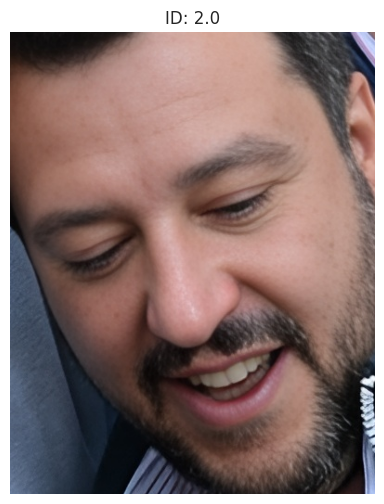

In [ ]:
#calculation of cosine similarity between target image and the others exctracted images
def matchFaces(target_face, df_dectected_faces, matching_threshold=0.5):
  matched_faces = []
  for i,face in df_dectected_faces.iterrows():
    similarity = cosine_similarity([target_face['embedding'].tolist()], [face['EMBEDDING'].tolist()])[0][0]
    if similarity>=matching_threshold:
      matched_faces.append((i,round(similarity,3)))

  return matched_faces

#visualisation of the results with : ID, the most similar faces in the input image, the cosine similarity, gender and age
def showMatchedFaces(matched_faces, df_dectected_faces):
  print("> Matched Faces:")
  if matched_faces:
    for item in matched_faces:
      matched_face = df_dectected_faces.iloc[int(item[0])]
      print(">> ID: {}\n\tSimilarity: {}\n\tGender: {}\n\tAge: {}\n".format(item[0],item[1],matched_face['GENDER'],matched_face['AGE']))
      bbox = matched_face['BBOX']
      plt.figure(figsize=(8, 6))
      plt.title("ID: {}".format(item[0]))
      plt.axis('off')
      plt.imshow(restored_img[bbox[1]:bbox[3],bbox[0]:bbox[2], ::-1])
      plt.show()
      print()
  else:
    print("No match! Try to decrease the value of matching_threshold.")


matched_faces = matchFaces(target_face, df_dectected_faces, matching_threshold=0.6)
showMatchedFaces(matched_faces, df_dectected_faces)